<span style="font-size:20px;"><b>Actividad 1: Proyecto de Python</b></span>
<br>
<b>Fecha:</b> 08/06/2025
<br>
<b>Autor:</b> Lesly Alejandra Escobar Aguilar

In [4]:
#Librerias
import pandas as act1
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns

<span style="font-size:25px;"><b>Importacion del Archivo</b></span>
<br>
<span style="font-size:15px;">Importaremos el archivo de libros, el cual tiene un total de 11123 registros, los cuales cuentan con nombre del loibro, autor, rating, numero de paginas y otros datos que nos ayudaran con nuestro analisis y futuros hallazgos.</span>

In [5]:
#importacion del archivo csv
df = act1.read_csv('books.csv', on_bad_lines='skip')

#Elimina espacios de las columnas
df.columns = df.columns.str.strip()

act1.set_option('display.max_rows', None) #Muesta todas las filas
act1.set_option('display.max_columns', None) #Muestra todas las columnas 

#ordenar datos segun el bookID de menor a mayor
df_sorted = df.sort_values(by='bookID', ascending=True)
df_sorted

,bookID,title,authors,average_rating,isbn,isbn13,language_code,num_pages,ratings_count,text_reviews_count,publication_date,publisher
0,1,Harry Potter and the Half-Blood Prince (Harry ...,J.K. Rowling/Mary GrandPré,4.57,0439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix (Har...,J.K. Rowling/Mary GrandPré,4.49,0439358078,9780439358071,eng,870,2153167,29221,9/1/2004,Scholastic Inc.
2,4,Harry Potter and the Chamber of Secrets (Harry...,J.K. Rowling,4.42,0439554896,9780439554893,eng,352,6333,244,11/1/2003,Scholastic
3,5,Harry Potter and the Prisoner of Azkaban (Harr...,J.K. Rowling/Mary GrandPré,4.56,043965548X,9780439655484,eng,435,2339585,36325,5/1/2004,Scholastic Inc.
4,8,Harry Potter Boxed Set Books 1-5 (Harry Potte...,J.K. Rowling/Mary GrandPré,4.78,0439682584,9780439682589,eng,2690,41428,164,9/13/2004,Scholastic
5,9,"Unauthorized Harry Potter Book Seven News: ""Ha...",W. Frederick Zimmerman,3.74,0976540606,9780976540601,en-US,152,19,1,4/26/2005,Nimble Books
6,10,Harry Potter Collection (Harry Potter #1-6),J.K. Rowling,4.73,0439827604,9780439827607,eng,3342,28242,808,9/12/2005,Scholastic
7,12,The Ultimate Hitchhiker's Guide: Five Complete...,Douglas Adams,4.38,0517226952,9780517226957,eng,815,3628,254,11/1/2005,Gramercy Books
8,13,The Ultimate Hitchhiker's Guide to the Galaxy ...,Douglas Adams,4.38,0345453743,9780345453747,eng,815,249558,4080,4/30/2002,Del Rey Books
9,14,The Hitchhiker's Guide to the Galaxy (Hitchhik...,Douglas Adams,4.22,1400052920,9781400052929,eng,215,4930,460,8/3/2004,Crown


<span style="font-size:25px;"><b>Limpieza y transformación de los datos<b></span>
<br>
<span style="font-size:15px;">Para la limpieza del archivo seleccionado comenzaremos con renombrar los nombres y eliminar espacio de las columnas, ademas de eliminar aquellos espacios en blanco que se encuentren en los registros, ademas de datos duplicados. Tambien se ha cambiado el tipo de datos de la columna "Rating" a numerico.</span>
<br>
<br>
<span>Otro cambio para mantener los datos limpios fue eliminar los parentesis que tenian algunos de los nombres de libros y que se mantenga solamente un autor por libro, ya que como se puede ver en la tabla anterior algunos tenian dos o mas autores, los cuales estaban separados por "/".</span>

In [7]:
# Cargar el dataset
df = act1.read_csv('books.csv', on_bad_lines='skip')

# Eliminar espacios en los nombres de columnas
df.columns = df.columns.str.strip()

# Renombrar columnas para que estén claras y en orden
df = df.rename(columns={
    'bookID': 'ID',
    'title': 'Title',
    'authors': 'Author',
    'average_rating': 'Rating',
    'isbn': 'ISBN',
    'isbn13': 'ISBN13',
    'language_code': 'Language',
    'num_pages': 'Num. Pages',
    'ratings_count': 'Ratings Count',
    'text_reviews_count': 'Reviews',
    'publication_date': 'Publication Date',
    'publisher': 'Publisher'
})

# Ordenamos por ID de menor a mayor
df = df.sort_values(by='ID', ascending=True)

# Eliminar duplicados si los hubiera
df = df.drop_duplicates()

# Limpia el título eliminando paréntesis y su contenido
df['Title'] = df['Title'].apply(lambda x: re.sub(r'\s*\(.*?\)', '', str(x)).strip())

# Limpia para dejar solo el primer autor si hay varios separados por "/"
df['Author'] = df['Author'].apply(lambda x: str(x).split('/')[0].strip())

# Rellenar valores faltantes donde tenga sentido
df['Publisher'] = df['Publisher'].fillna('Unknown')
df['Language'] = df['Language'].fillna('Unknown')

# Eliminar filas donde falten datos esenciales (Título, Autor, Rating)
df = df.dropna(subset=['Title', 'Author', 'Rating'])

# Convertir calificación a numérico por si hay errores
df['Rating'] = act1.to_numeric(df['Rating'], errors='coerce')

# Vista previa
act1.set_option('display.max_rows', 1000)
df.head(1000)



,ID,Title,Author,Rating,ISBN,ISBN13,Language,Num. Pages,Ratings Count,Reviews,Publication Date,Publisher
0,1,Harry Potter and the Half-Blood Prince,J.K. Rowling,4.57,0439785960,9780439785969,eng,652,2095690,27591,9/16/2006,Scholastic Inc.
1,2,Harry Potter and the Order of the Phoenix,J.K. Rowling,4.49,0439358078,9780439358071,eng,870,2153167,29221,9/1/2004,Scholastic Inc.
2,4,Harry Potter and the Chamber of Secrets,J.K. Rowling,4.42,0439554896,9780439554893,eng,352,6333,244,11/1/2003,Scholastic
3,5,Harry Potter and the Prisoner of Azkaban,J.K. Rowling,4.56,043965548X,9780439655484,eng,435,2339585,36325,5/1/2004,Scholastic Inc.
4,8,Harry Potter Boxed Set Books 1-5,J.K. Rowling,4.78,0439682584,9780439682589,eng,2690,41428,164,9/13/2004,Scholastic
5,9,"Unauthorized Harry Potter Book Seven News: ""Ha...",W. Frederick Zimmerman,3.74,0976540606,9780976540601,en-US,152,19,1,4/26/2005,Nimble Books
6,10,Harry Potter Collection,J.K. Rowling,4.73,0439827604,9780439827607,eng,3342,28242,808,9/12/2005,Scholastic
7,12,The Ultimate Hitchhiker's Guide: Five Complete...,Douglas Adams,4.38,0517226952,9780517226957,eng,815,3628,254,11/1/2005,Gramercy Books
8,13,The Ultimate Hitchhiker's Guide to the Galaxy,Douglas Adams,4.38,0345453743,9780345453747,eng,815,249558,4080,4/30/2002,Del Rey Books
9,14,The Hitchhiker's Guide to the Galaxy,Douglas Adams,4.22,1400052920,9781400052929,eng,215,4930,460,8/3/2004,Crown


<span style="font-size:20px;">Guardamos el archivo con los datos ya limpios</span>

In [10]:
#Guardar el archivo excel
df.to_csv('books_limpio.csv', index=False, encoding='utf-8')


<span style="font-size:25px;"><b>Análisis exploratorio de datos (eda)<b></span>
<br>
<span style="font-size:15px;">Para el analisis de datos primero revisamos la descripcion del dataset, el cual nos indica que nuestro conjunto de datos tiene 11123 registros con variables que incluyen título, autor, idioma, número de páginas, calificación promedio (Rating), cantidad de reseñas, entre otros. Ademas nos permite verificar la popularidad del libro.</span>
<br>
<span>A continuacion se han realizado calculos entre ellos calculo del promedio o Rating, lenguaje frecuente, libros con mayor numero de paginas, entre otros.</span>

In [8]:
# Descripcion del dataset
print("=== Descripción del dataset ===\n")
print(df.describe())

#Lenguaje frecuente
print("\n=== Top 10 idiomas más frecuentes ===")
print("Top 10 idiomas:")
print(df['Language'].value_counts().head(10))

#Rating por autor mas popular
print("\n=== Promedio de calificación por autor más popular ===")
top_authors = df['Author'].value_counts().head(10).index
print(df[df['Author'].isin(top_authors)].groupby('Author')['Rating'].mean())

#Numero de paginas mas extenso
print("\n=== Top 5 libros con más páginas ===")
print(df[['Title', 'Num. Pages']].sort_values(by='Num. Pages', ascending=False).head(5))

#Cuartiles
print("\n=== Cuartiles, percentiles y rango ===")
q1 = df['Rating'].quantile(0.25)
q2 = df['Rating'].quantile(0.50)  # Mediana
q3 = df['Rating'].quantile(0.75)
print("Q1 (25%):", q1)
print("Q2 (50%) - Mediana:", q2)
print("Q3 (75%):", q3)

#Percentiles
p10 = df['Rating'].quantile(0.10)
p90 = df['Rating'].quantile(0.90)
print("Percentil 10:", p10)
print("Percentil 90:", p90)

#Rango
rango = df['Rating'].max() - df['Rating'].min()
print("Rango:", rango)

print("\n=== Media, Mediana y Moda ===")
#Media, mediana y moda
media = df['Rating'].mean()
mediana = df['Rating'].median()
moda = df['Rating'].mode().values[0]
print("Media:", media)
print("Mediana:", mediana)
print("Moda:", moda)

=== Descripción del dataset ===

                 ID        Rating        ISBN13    Num. Pages  Ratings Count  \
count  11123.000000  11123.000000  1.112300e+04  11123.000000   1.112300e+04   
mean   21310.856963      3.934075  9.759880e+12    336.405556   1.794285e+04   
std    13094.727252      0.350485  4.429758e+11    241.152626   1.124992e+05   
min        1.000000      0.000000  8.987060e+09      0.000000   0.000000e+00   
25%    10277.500000      3.770000  9.780345e+12    192.000000   1.040000e+02   
50%    20287.000000      3.960000  9.780582e+12    299.000000   7.450000e+02   
75%    32104.500000      4.140000  9.780872e+12    416.000000   5.000500e+03   
max    45641.000000      5.000000  9.790008e+12   6576.000000   4.597666e+06   

            Reviews  
count  11123.000000  
mean     542.048099  
std     2576.619589  
min        0.000000  
25%        9.000000  
50%       47.000000  
75%      238.000000  
max    94265.000000  

=== Top 10 idiomas más frecuentes ===
Top 10 id

<span style="font-size:15px;">Para los resultados de Cuartiles, percentiles, rango y Media, Mediana y Moda, se ha utilizado como dato principal la columna de Rating, segun los resultados podemos observar que las calificaciones de popularidad (Rating) se mantienen en el indice 4, donde la mayoria mantiene una buena aceptacion por parte del publico al que esta dirigido.</span>
<br>
<span style="font-size:15px;">Otro de los resultados que podemos observar es el idioma en que esta escrito el libro, dominando el idioma ingles como uno de los mas populares a la hora de publicar. En cuanto al número de páginas el libro The Complete Aubrey/Maturin Novels con 6576 páginas es el libro mas extenso segun los resultados. El promedio de páginas por libro es de 336.</span>
<br>
<span style="font-size:15px;">Entre los autores más frecuentes, se encuentran J.R.R. Tolkien y Rumiko Takahashi, quienes además destacan por tener calificaciones promedio superiores a 4.1, otros autores reconocidos son Stephen King, Agatha Christie y William Shakespeare.</span>
<br>
<span style="font-size:15px;">El dataset tiene una fuerte inclinación hacia libros valorados, predomina el idioma inglés, existe una gran variedad de popularidad entre las reseñas, calificaciones y páginas. Estos datos se convierten en un recurso útil para analizar tendencias editoriales y preferencias que existen en el publico lector.</span>

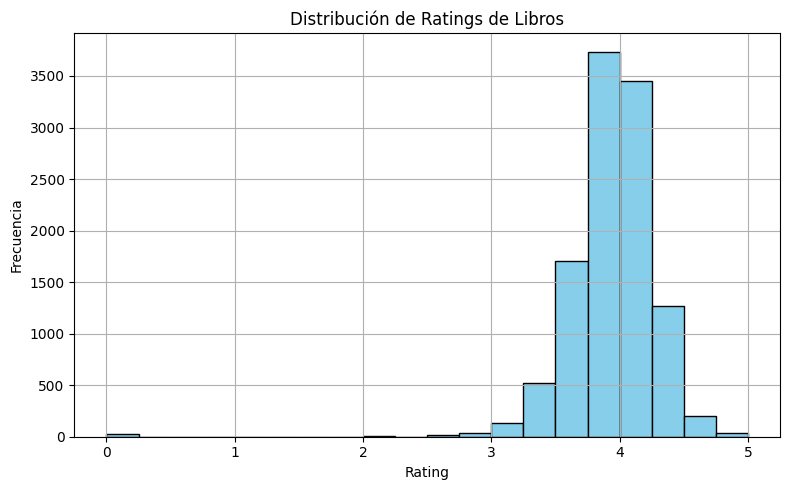

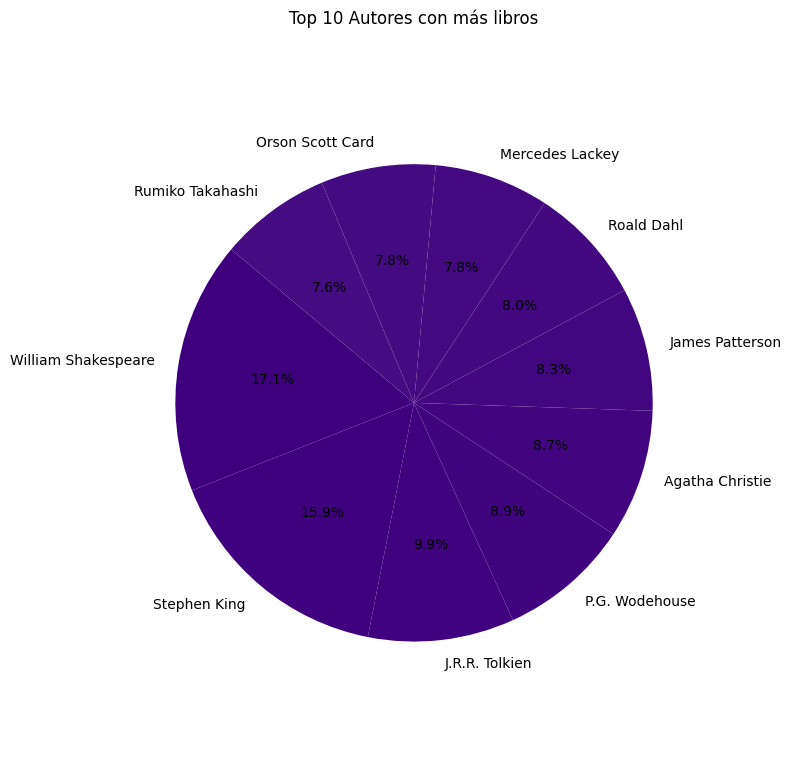

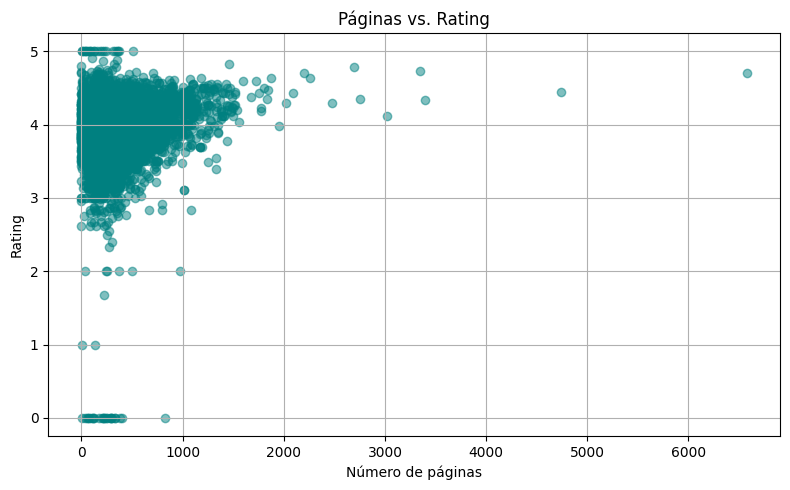

In [12]:
#Grafica por Rating
plt.figure(figsize=(8, 5))
plt.hist(df['Rating'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribución de Ratings de Libros')
plt.xlabel('Rating')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.tight_layout()
plt.show()

#Grafica por autores
top_authors = df['Author'].value_counts().head(10)

plt.figure(figsize=(8, 8))
plt.pie(top_authors, labels=top_authors.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Purples_r(range(10)))
plt.title('Top 10 Autores con más libros')
plt.axis('equal')  
plt.tight_layout()
plt.show()


#Grafico por numero de paginas y Rating
plt.figure(figsize=(8, 5))
plt.scatter(df['Num. Pages'], df['Rating'], alpha=0.5, color='teal')
plt.title('Páginas vs. Rating')
plt.xlabel('Número de páginas')
plt.ylabel('Rating')
plt.grid(True)
plt.tight_layout()
plt.show()


<span style="font-size:25px;"><b>Visualización de resultados<b></span>
<br>
<span style="font-size:15px;"><b>Distribución de Ratings de Libros</b></span>
<span style="font-size:15px;">
    <ul>
        <li>La mayoría de los libros se encuentran concentrados entre los valores de 3.5 y 4.5, lo cual indica una tendencia hacia calificaciones positivas.</li>
        <li>Hay muy pocos libros con calificaciones por debajo de 2, lo que sugiere que la mayoría de los libros en el dataset han sido bien recibidos por los lectores.</li>
        <li>El pico más alto está alrededor de 4.0, lo cual concuerda con la moda que ya habías identificado.</li>
    </ul>
</span>
<br>
<span style="font-size:15px;"><b> Top 10 Autores con más libros</b></span>
<span style="font-size:15px;">
    <ul>
        <li>William Shakespeare destaca como el autor con mayor cantidad de libros en el conjunto de datos.</li>
        <li>Otros de los autoes mas populares son Stephen King y J.R.R. Tolkien, ambos también con una representación significativa entre el publico lector.</li>
        <li>El dataset incluye una cantidad considerable de libros de autores reconocidos mundialmente.</li>
    </ul>
</span>
<br>
<span style="font-size:15px;"><b> Relación entre Número de Páginas y Rating</b></span>
<span style="font-size:15px;">
    <ul>
        <li>Se observa una alta concentración de puntos (libros) entre las 1000 páginas, con calificaciones que se mantienen cercanas al valor de 4.</li>
        <li>Algunos libros muy extensos (más de 2000 páginas) también muestran buenos ratings</li>
        <li>El tamaño del libro no es determinante en la percepción de calidad por parte de los lectores.</li>
    </ul>
</span>